In [1]:
%load_ext autoreload
%matplotlib inline

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns  # Seaborn enhances the aesthetics of matplotlib plots

import pandas as pd
import xarray as xr
import seaborn as sns
import warnings
import logging
# sns.set()

from tempest import casestudy
from tempest import grid
from tempest import storm_tracker
from tempest import joint_distrib
from tempest import handler
from tempest.plots.hist import simple_hist


In [2]:
# settings_path = 'settings/sam_4km_30min_30d.yaml'
# settings_paths = ["settings/arpege_summer_30d.yaml", "settings/fv3_summer_30d.yaml", "settings/ifs_summer_30d.yaml" , "settings/mpas_summer_30d.yaml", 
#                   "settings/nicam_summer_30d.yaml", "settings/obs_summer_30d.yaml", "settings/sam_summer_30d.yaml", "settings/sam_4km_30min_30d.yaml",
#                 "settings/um_summer_30d.yaml"]
#"settings/sam_4km_30min_30d.yaml", 

settings_paths = ["settings/obs_summer_30d.yaml", "settings/arpege_summer_30d.yaml", "settings/mpas_summer_30d.yaml", "settings/sam_summer_30d.yaml"]

hdlrs = [handler.Handler(settings_path) for settings_path in settings_paths]
css = [casestudy.CaseStudy(hdlr, overwrite = False ,verbose = False) for hdlr in hdlrs]
grs = [grid.Grid(cs, fast = True, overwrite= False, verbose_steps = False, verbose = False) for cs in css]
jds = [joint_distrib.JointDistribution(gr, None, var_id_1 = "mean_unweighted_Prec", var_id_2 = "cond_alpha_85_Prec", 
        nbpd = 20,  nd=5, overwrite = True, dist_mask = False) for gr in grs]

lm = grs[0].get_landmask()
ocean = lm.Landmask == 0
ocean = ocean.values[:,:,np.newaxis]

Data loaded from /homedata/mcarenso/tempest/OBS_lowRes_Tropics/var_id_days_i_t.json
Data loaded from /homedata/mcarenso/tempest/ARPEGE_lowRes_Tropics/var_id_days_i_t.json
Data loaded from /homedata/mcarenso/tempest/MPAS_lowRes_Tropics/var_id_days_i_t.json
Data loaded from /homedata/mcarenso/tempest/SAM_lowRes_Tropics/var_id_days_i_t.json
Found grid attributes file , so loading /homedata/mcarenso/tempest/OBS_lowRes_Tropics/grid_attributes.pkl instead of computing
Found grid attributes file , so loading /homedata/mcarenso/tempest/ARPEGE_lowRes_Tropics/grid_attributes.pkl instead of computing
Found grid attributes file , so loading /homedata/mcarenso/tempest/MPAS_lowRes_Tropics/grid_attributes.pkl instead of computing
Found grid attributes file , so loading /homedata/mcarenso/tempest/SAM_lowRes_Tropics/grid_attributes.pkl instead of computing


/net/nfs/tools/u20/Python/miniconda3_py310_22.11.1-1/envs/pangeo-meso-2023.04.15/lib/python3.10/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


Distribs have been recomputed because overwrite is set to True
Overwrite set to true, so computing basics and saving them


/net/nfs/tools/u20/Python/miniconda3_py310_22.11.1-1/envs/pangeo-meso-2023.04.15/lib/python3.10/site-packages/numpy/lib/histograms.py:1123: RuntimeWarning: invalid value encountered in divide
  hist = hist / dedges[i].reshape(shape)


Distribs have been recomputed because overwrite is set to True
Overwrite set to true, so computing basics and saving them
Distribs have been recomputed because overwrite is set to True
Overwrite set to true, so computing basics and saving them
Distribs have been recomputed because overwrite is set to True
Overwrite set to true, so computing basics and saving them


In [3]:
settings_path_obs = 'settings/obs_summer_30d.yaml'
hdlr_obs = handler.Handler(settings_path_obs)
cs_obs = casestudy.CaseStudy(hdlr_obs, overwrite = False ,verbose = False)
gr_obs = grid.Grid(cs_obs, fast = True, overwrite= False, verbose_steps = False, verbose = False)
st_obs = storm_tracker.StormTracker(gr_obs, label_var_id = "MCS_label", overwrite_storms = False, overwrite = False)
jd_obs = joint_distrib.JointDistribution(gr_obs, st_obs, var_id_1 = "mean_unweighted_Prec", var_id_2 = "cond_alpha_85_Prec",nbpd = 20,  nd=5, overwrite = True, dist_mask = False)

Data loaded from /homedata/mcarenso/tempest/OBS_lowRes_Tropics/var_id_days_i_t.json
Found grid attributes file , so loading /homedata/mcarenso/tempest/OBS_lowRes_Tropics/grid_attributes.pkl instead of computing


/net/nfs/tools/u20/Python/miniconda3_py310_22.11.1-1/envs/pangeo-meso-2023.04.15/lib/python3.10/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


Distribs have been recomputed because overwrite is set to True
Overwrite set to true, so computing basics and saving them


/net/nfs/tools/u20/Python/miniconda3_py310_22.11.1-1/envs/pangeo-meso-2023.04.15/lib/python3.10/site-packages/numpy/lib/histograms.py:1123: RuntimeWarning: invalid value encountered in divide
  hist = hist / dedges[i].reshape(shape)


Retrieve labels in jdist
Time elapsed for propagating all labels: 13.11 seconds


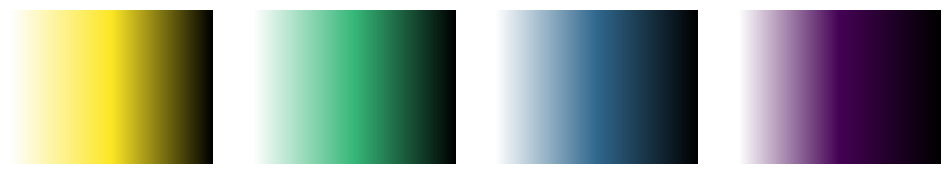

In [4]:
# Define the values and colormap
values = np.array([1, 2, 3, 4])
cmap = mpl.cm.viridis
norm = mpl.colors.BoundaryNorm(np.arange(0.5, 5), cmap.N)

# Sample colors from the viridis colormap
colors = cmap(norm(values))

cmaps = []
# Function to create a unicolor colormap with white/blank first, base color, then dark
def create_unicolor_colormap(base_color):
    # Create colors that start from white, transition to the base color, then to dark
    start = np.array([1, 1, 1, 1])  # white color
    end = np.array([0, 0, 0, 1])    # dark color
    middle = np.array(base_color) # base color
    new_colors = [start * (1 - i) + middle * i for i in np.linspace(0, 1, 256)]
    new_colors += [middle * (1 - i) + end * i for i in np.linspace(0, 1, 256)]
    return mpl.colors.LinearSegmentedColormap.from_list("unicolor", new_colors)

for i, color in enumerate(colors[::-1]):
    new_cmap = create_unicolor_colormap(color)
    cmaps.append(new_cmap)

# Example usage: Visualizing the colormaps
fig, axs = plt.subplots(nrows=1, ncols=len(cmaps), figsize=(12, 2))
for ax, cmap in zip(axs, cmaps):
    gradient = np.linspace(0, 1, 256)
    gradient = np.vstack((gradient, gradient))
    ax.imshow(gradient, aspect='auto', cmap=cmap)
    ax.axis('off')
plt.show()

figure size = 15 3.25


/scratchx/mcarenso/ipykernel_1719428/4093124302.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.439963768115942, y0=0.7126086956521739, x1=0.5850362318840581, y1=0.88)


/scratchx/mcarenso/ipykernel_1719428/4093124302.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.439963768115942, y0=0.5117391304347826, x1=0.5850362318840581, y1=0.6791304347826087)


/scratchx/mcarenso/ipykernel_1719428/4093124302.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.43996376811594207, y0=0.3108695652173913, x1=0.585036231884058, y1=0.47826086956521735)


/scratchx/mcarenso/ipykernel_1719428/4093124302.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))
/scratchx/mcarenso/ipykernel_1719428/4093124302.py:126: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Bbox(x0=0.439963768115942, y0=0.10999999999999999, x1=0.5850362318840581, y1=0.2773913043478261)


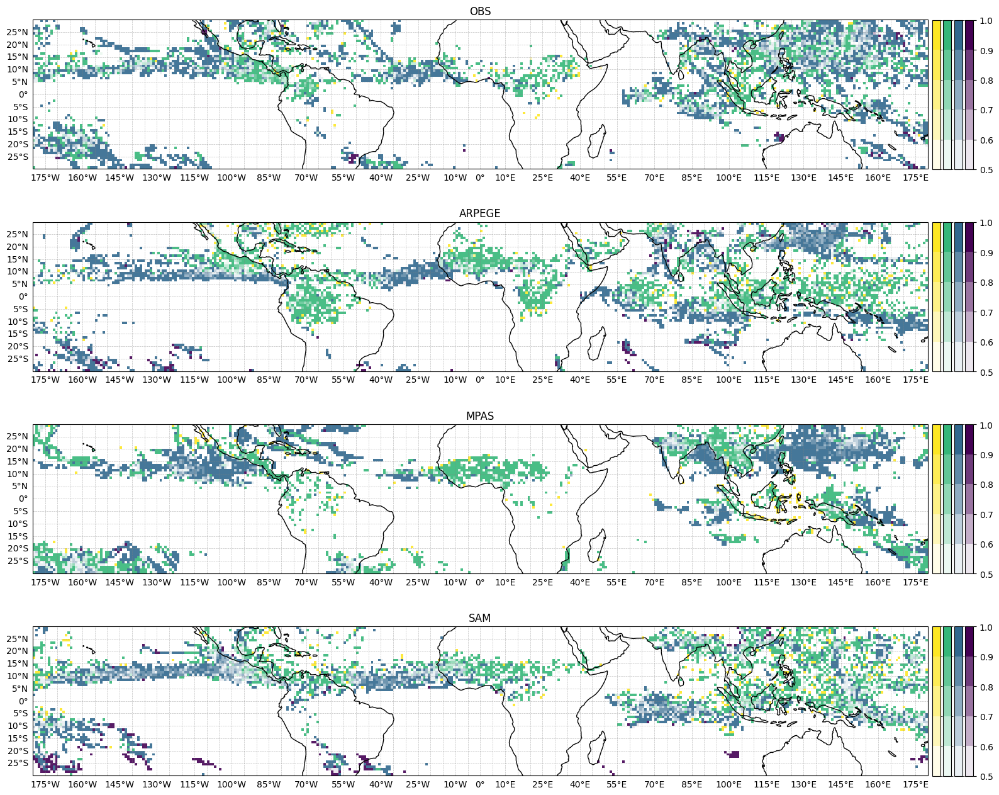

In [5]:
#### fig 3 maps 
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import warnings
import cartopy.crs as ccrs
import matplotlib.ticker as mticker

####################### This block defines the values and colormap #################################
values = np.array([1, 2, 3, 4])
cmap = mpl.cm.viridis
norm = mpl.colors.BoundaryNorm(np.arange(0.5, 5), cmap.N)

# Sample colors from the viridis colormap
colors = cmap(norm(values))

cmaps = []
# Function to create a unicolor colormap with white/blank first, base color, then dark
def create_unicolor_colormap(base_color):
    # Create colors that start from white, transition to the base color, then to dark
    start = np.array([1, 1, 1, 1])  # white color
    end = np.array(base_color) # base color
    light_color = start + (end - start) * 0.1
    new_colors = [light_color * (1 - i) + end * i for i in np.linspace(0, 1, 256)]
    return mpl.colors.LinearSegmentedColormap.from_list("unicolor", new_colors)

for i, color in enumerate(colors[::-1]):
    new_cmap = create_unicolor_colormap(color)
    cmaps.append(new_cmap)
#####################################################################################################

colormaps = cmaps

# Norms (assuming same boundaries for simplification)
norms = [mpl.colors.BoundaryNorm([0.5, 0.6, 0.7, 0.8, 0.9, 1], colormap.N) for colormap in colormaps]

#### This block makes mask_all 
rank_conv_min = 99
rank_acc_min = 99
mask_alls =[]

# Assume jds is already defined and filled with the necessary data
figdir = '/figures/'

for jd in jds: 
    jd.make_mask()
    mask_rank_conv = np.outer(jd.dist1.ranks >= 0, jd.dist2.ranks >= rank_conv_min)
    mask_rank_acc = np.outer(jd.dist1.ranks >= rank_acc_min , jd.dist2.ranks >= 0)
    mask_alls.append([
        np.logical_and(jd.mask_branch1_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_c_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_ac_90, mask_rank_acc), 
        np.logical_and(jd.mask_branch2_90, mask_rank_acc)
    ])
####

# Calculate figure size based on jd grid
dlon = np.diff((jds[0].grid.casestudy.lon_slice.start, jds[0].grid.casestudy.lon_slice.stop))[0] % 360
if dlon == 0: dlon = 360
dlat = np.diff((jds[0].grid.casestudy.lat_slice.start, jds[0].grid.casestudy.lat_slice.stop))[0]
Lx_fig = 15
Lx_cbar = 1.5
Ly_title = 1
Ly_fig = (Lx_fig - Lx_cbar) / dlon * dlat + Ly_title
print('figure size =', Lx_fig, Ly_fig)

# Initialize figure with subplots
fig, axes = plt.subplots(len(jds), 1, figsize=(Lx_fig, Ly_fig * len(jds)), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=0)})

if len(jds) == 1:
    axes = [axes]

for jd, mask_all, ax in zip(jds, mask_alls, axes):
    list_mask_yxt = []
    for mask_ranked, cmap in zip(mask_all, cmaps):
        mask_yxt = jd.get_mask_yxt_from_mask_jdist(mask_ranked)
        list_mask_yxt.append(mask_yxt)
    mask_yxt_stacked = np.stack(list_mask_yxt)
    mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))
    data_layers = [data for data in mask_yxt_stacked]
    for data in data_layers:
        data[data < 0.5] = np.nan

    lat_1d = jd.get_coord_values('lat')
    lon_1d = jd.get_coord_values('lon')
    lon_meshgrid, lat_meshgrid = np.meshgrid(lon_1d, lat_1d)

    width = 0.06
    height = 1.09
    bottom = 0.1
    base_cax_positions = [[i-0.20, bottom, width, height] for i in [4, 4.08, 4.16, 4.24]]

    # Get the current axis position to adjust the cax positions accordingly
    pos = ax.get_position()
    print(pos)
    cax_positions = []

    for base_pos in base_cax_positions:
        cax_positions.append([
            pos.x0 + base_pos[0] * pos.width,
            1.23*(pos.y0-0.10)+0.025, #+ base_pos[1]* pos.height,
            base_pos[2] * pos.width,
            base_pos[3] * pos.height
        ])

    for i, (data, colormap, norm) in enumerate(zip(data_layers, colormaps, norms)):
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            im = ax.pcolormesh(lon_meshgrid, lat_meshgrid, data, transform=ccrs.PlateCarree(), alpha=0.9, cmap=colormap, norm=norm)
        
        cax = fig.add_axes(cax_positions[i])
        cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap), cax=cax, ticks=[0.5, 0.6, 0.7, 0.8, 0.9, 1], spacing='uniform')
        if i != 3: 
            cb.set_ticks([]) 

    ax.set_title(jd.name[:-15])
    ax.coastlines('110m')
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator(range(-180, 181, 5))
    gl.ylocator = mticker.FixedLocator(range(-90, 91, 5))
    gl.top_labels = False  # Turn off labels on top x-axis
    gl.right_labels = False  # Turn off labels on right y-axis
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

plt.tight_layout()
# plt.show()

Only km-scale
figure size = 15 3.25
Mostly km-scale
figure size = 15 3.25
Mostly 1°x1day
figure size = 15 3.25
Only 1°x1day
figure size = 15 3.25
Only km-scale
figure size = 15 3.25
Mostly km-scale
figure size = 15 3.25
Mostly 1°x1day
figure size = 15 3.25
Only 1°x1day
figure size = 15 3.25
Only km-scale
figure size = 15 3.25
Mostly km-scale
figure size = 15 3.25
Mostly 1°x1day
figure size = 15 3.25
Only 1°x1day
figure size = 15 3.25
Only km-scale
figure size = 15 3.25
Mostly km-scale
figure size = 15 3.25
Mostly 1°x1day
figure size = 15 3.25
Only 1°x1day
figure size = 15 3.25


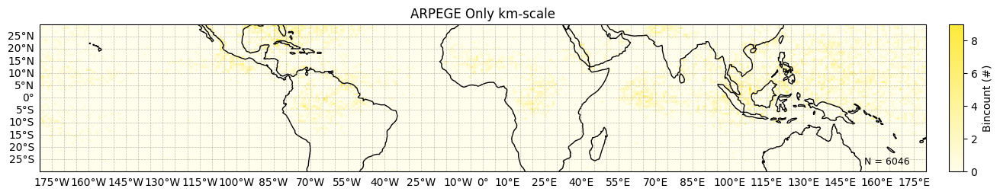

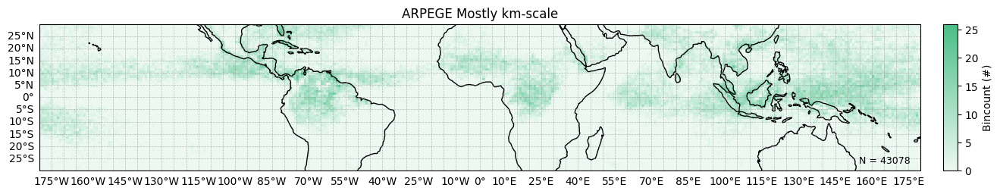

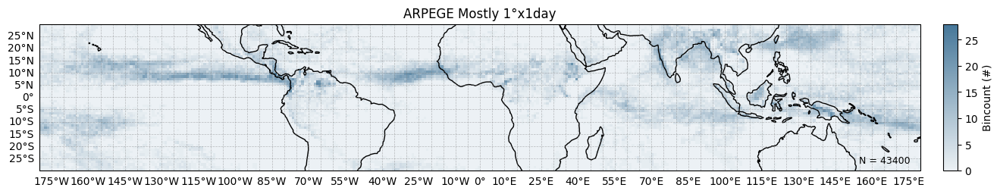

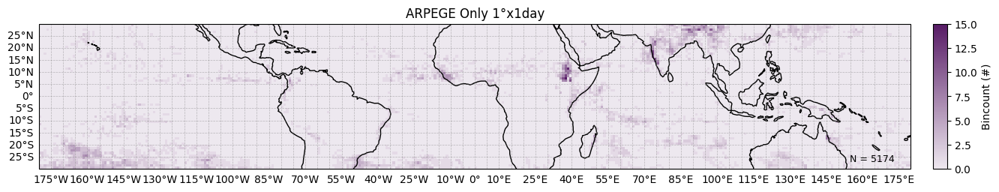

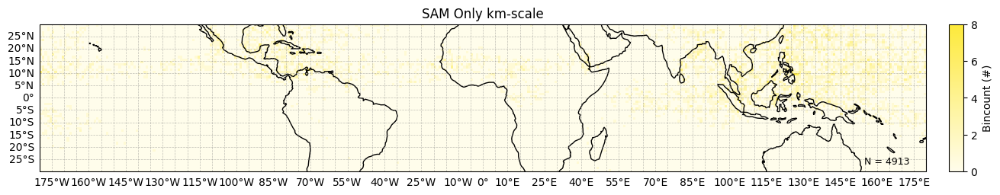

...

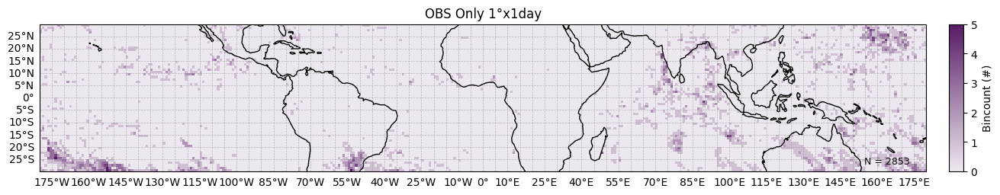

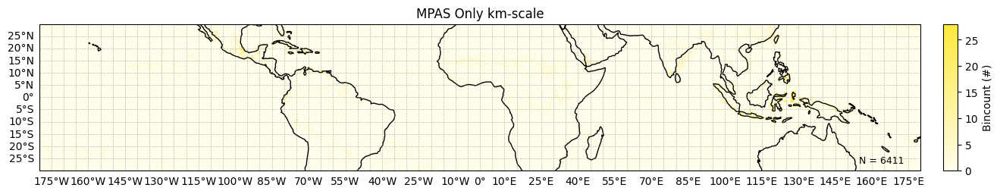

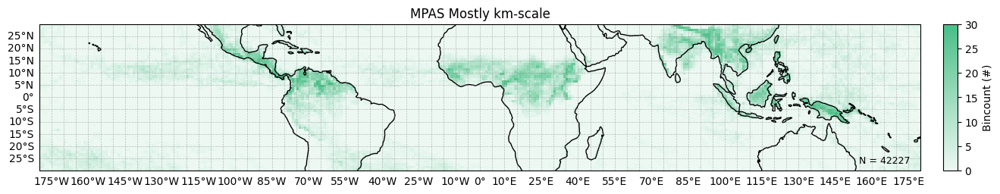

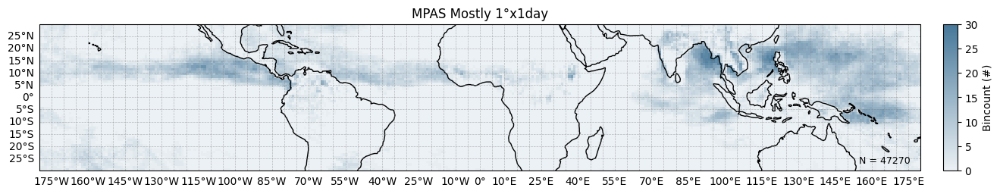

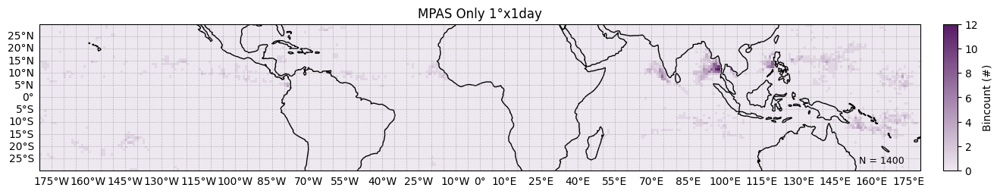

In [8]:
import cartopy.crs as ccrs
import os 
%matplotlib inline
# Show frequency maps of extremes in the 4 regions (normalized by total bincount in mask?)

rank_conv_min = 90
rank_acc_min = 90
mask_alls =[]

for jd in jds: 
    jd.make_mask()
    mask_rank_conv = np.outer(jd.dist1.ranks >= 0, jd.dist2.ranks >= rank_conv_min)
    mask_rank_acc = np.outer(jd.dist1.ranks >= rank_acc_min , jd.dist2.ranks >= 0)
    mask_alls.append([
        np.logical_and(jd.mask_branch1_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_c_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_ac_90, mask_rank_acc), 
        np.logical_and(jd.mask_branch2_90, mask_rank_acc)
        ])

mask_names = 'Only km-scale','Mostly km-scale','Mostly 1°x1day','Only 1°x1day'
mask_labels = 'km-scale','mostly km-scale','mostly 1°x1day','1°x1day'
figdir = '/figures/'

for jd, mask_all in zip(jds, mask_alls):    
    for mask_ranked,mask_name,mask_label, cmap in zip(mask_all,mask_names,mask_labels, cmaps):
        
        print(mask_name)
        mask_yxt = jd.get_mask_yxt_from_mask_jdist(mask_ranked)
        ax, cbar = jd.make_map(mask_yxt, data = None, cmap=cmap)    
        ax.set_title(jd.name[:-15] + " " + mask_name)

figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25
figure size = 15 3.25


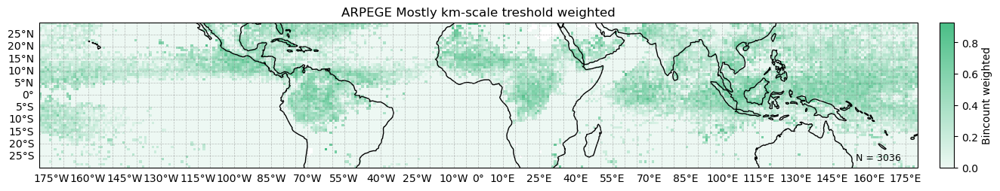

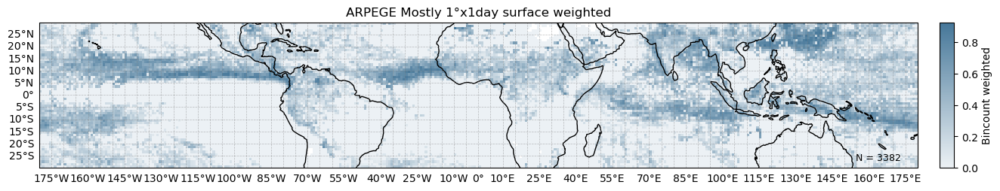

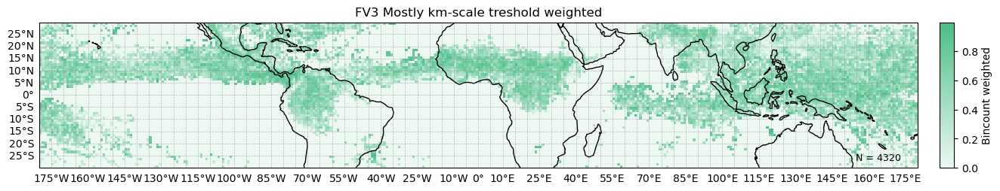

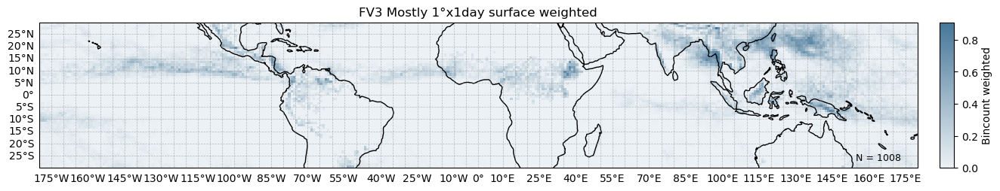

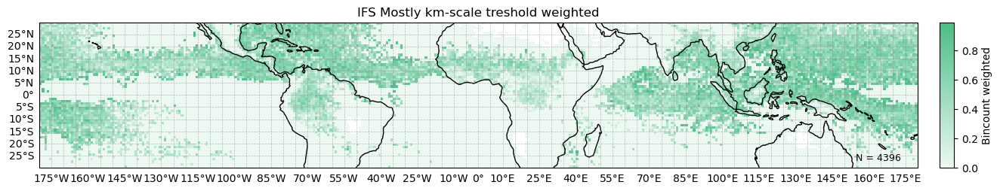

...

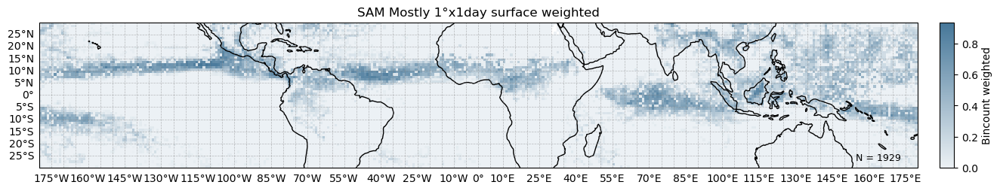

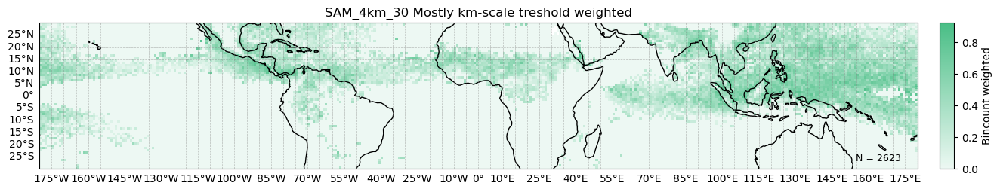

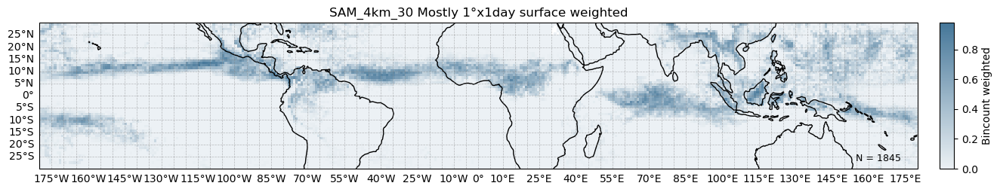

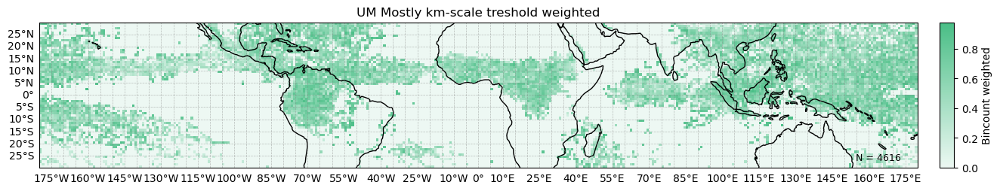

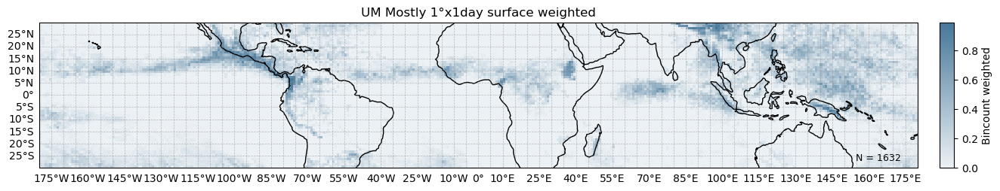

In [67]:
import cartopy.crs as ccrs
import os 
%matplotlib inline
# Show frequency maps of extremes in the 4 regions (normalized by total bincount in mask?)

rank_conv_min = 90
rank_acc_min = 90
mask_alls =[]

for jd in jds: 
    jd.make_mask()
    mask_rank_conv = np.outer(jd.dist1.ranks >= 0, jd.dist2.ranks >= rank_conv_min)
    mask_rank_acc = np.outer(jd.dist1.ranks >= rank_acc_min , jd.dist2.ranks >= 0)
    mask_alls.append([
        np.logical_and(jd.mask_coloc_c_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_ac_90, mask_rank_acc), 
        ])

mask_names = 'Mostly km-scale treshold weighted','Mostly 1°x1day surface weighted',
mask_labels = 'mostly km-scale weighted','mostly 1°x1day weighted'
figdir = '/figures/'
weights = ["threshold_cond_alpha_85_Prec", "Sigma_cond_alpha_85_Prec"]

for jd, mask_all in zip(jds, mask_alls):    
    for mask_ranked,mask_name,mask_label, cmap, weight_name in zip(mask_all,mask_names,mask_labels, cmaps[1:-1], weights):
        mask_yxt = jd.get_mask_yxt_from_mask_jdist(mask_ranked)
        ax, cbar = jd.make_map(mask_yxt, func = "data_weighted", data = jd.prec[weight_name].values, cmap=cmap)    
        ax.set_title(jd.name[:-15] + " " + mask_name)

/scratchx/mcarenso/ipykernel_1716158/3317045367.py:57: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis = -1) / np.sum(mask_yxt_stacked, axis = (0, -1))


figure size = 15 3.25


/scratchx/mcarenso/ipykernel_1716158/3317045367.py:57: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis = -1) / np.sum(mask_yxt_stacked, axis = (0, -1))


figure size = 15 3.25


/scratchx/mcarenso/ipykernel_1716158/3317045367.py:57: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis = -1) / np.sum(mask_yxt_stacked, axis = (0, -1))


figure size = 15 3.25


/scratchx/mcarenso/ipykernel_1716158/3317045367.py:57: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis = -1) / np.sum(mask_yxt_stacked, axis = (0, -1))


figure size = 15 3.25


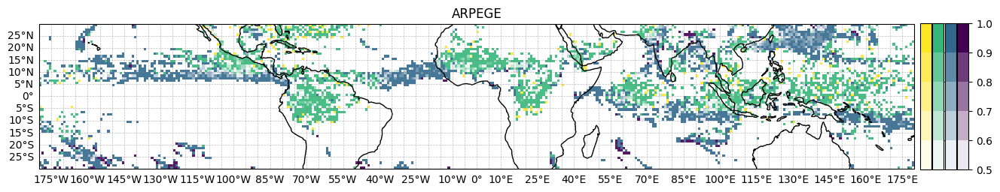

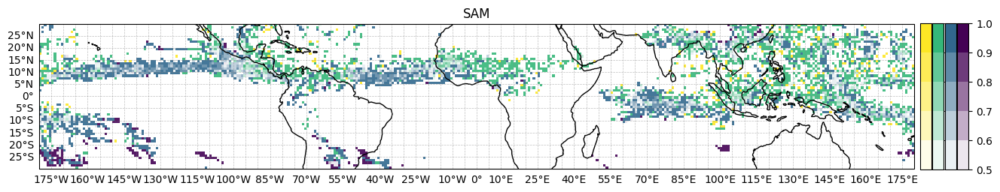

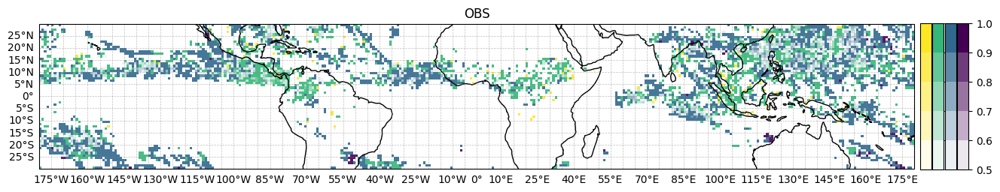

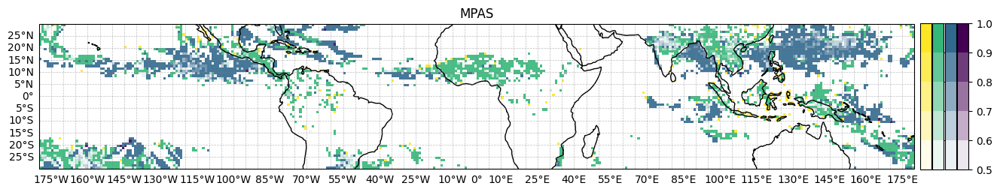

In [9]:
import matplotlib.ticker as mticker

####################### This block defines the values and colormap #################################
values = np.array([1, 2, 3, 4])
cmap = mpl.cm.viridis
norm = mpl.colors.BoundaryNorm(np.arange(0.5, 5), cmap.N)

# Sample colors from the viridis colormap
colors = cmap(norm(values))

cmaps = []
# Function to create a unicolor colormap with white/blank first, base color, then dark
def create_unicolor_colormap(base_color):
    # Create colors that start from white, transition to the base color, then to dark
    start = np.array([1, 1, 1, 1])  # white color
    end = np.array(base_color) # base color
    light_color = start + (end - start) * 0.1
    new_colors = [light_color * (1 - i) + end * i for i in np.linspace(0, 1, 256)]
    return mpl.colors.LinearSegmentedColormap.from_list("unicolor", new_colors)

for i, color in enumerate(colors[::-1]):
    new_cmap = create_unicolor_colormap(color)
    cmaps.append(new_cmap)
#####################################################################################################

colormaps = cmaps

# Norms (assuming same boundaries for simplification)
norms = [mpl.colors.BoundaryNorm([0.5, 0.6, 0.7, 0.8, 0.9, 1], colormap.N) for colormap in colormaps]

#### This block makes mask_all 
rank_conv_min = 99
rank_acc_min = 99
mask_alls =[]


figdir = '/figures/'

for jd in jds: 
    jd.make_mask()
    mask_rank_conv = np.outer(jd.dist1.ranks >= 0, jd.dist2.ranks >= rank_conv_min)
    mask_rank_acc = np.outer(jd.dist1.ranks >= rank_acc_min , jd.dist2.ranks >= 0)
    mask_alls.append([
        np.logical_and(jd.mask_branch1_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_c_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_ac_90, mask_rank_acc), 
        np.logical_and(jd.mask_branch2_90, mask_rank_acc)
        ])
####

for jd, mask_all in zip(jds, mask_alls):    
    list_mask_yxt = []
    for mask_ranked, cmap in zip(mask_all, cmaps):
        mask_yxt = jd.get_mask_yxt_from_mask_jdist(mask_ranked)
        list_mask_yxt.append(mask_yxt)
    mask_yxt_stacked = np.stack(list_mask_yxt)
    mask_yxt_stacked = np.sum(mask_yxt_stacked, axis = -1) / np.sum(mask_yxt_stacked, axis = (0, -1))
    data_layers = [data for data in mask_yxt_stacked]
    for data in data_layers:
        data[data < 0.5] = np.nan

#### This block prepares plot 
    dlon = np.diff((jd.grid.casestudy.lon_slice.start, jd.grid.casestudy.lon_slice.stop))[0] % 360
    if dlon == 0: dlon = 360
    dlat = np.diff((jd.grid.casestudy.lat_slice.start, jd.grid.casestudy.lat_slice.stop))[0]
    Lx_fig = 15
    Lx_cbar = 1.5
    Ly_title = 1
    Ly_fig = (Lx_fig-Lx_cbar)/dlon*dlat + Ly_title
    print('figure size =',Lx_fig,Ly_fig)
    
    # initialize figure
    fig = plt.figure(figsize=(Lx_fig,Ly_fig))
    ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=0))
    
    # coords
    lat_1d = jd.get_coord_values('lat')
    lon_1d = jd.get_coord_values('lon')
    
    lon_meshgrid, lat_meshgrid = np.meshgrid(lon_1d, lat_1d)
####
    width = 0.01
    height = 0.6
    bottom = 0.195
    cax_positions = [[0.905, bottom, width, height], [0.916, bottom, width, height], [0.927, bottom, width, height], [0.938, bottom, width, height]]

    for i, (data, colormap, norm) in enumerate(zip(data_layers, colormaps, norms)):
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            im = ax.pcolormesh(lon_meshgrid, lat_meshgrid, data, transform=ccrs.PlateCarree(), alpha=0.9, cmap=colormap, norm = norm)
        # heatmap, _ = jd.plot_data(data, cmap=colormap, fig=fig, ax=ax, label = labels[i])
        # _ = _.remove()
        
        cax = fig.add_axes(cax_positions[i])
        cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap), cax=cax, ticks=[0.5, 0.6, 0.7, 0.8, 0.9, 1], spacing='uniform')
        if i !=3 : cb.set_ticks([]) 

    ax.set_title(jd.name[:-15])
    # we draw coasts
    ax.coastlines('110m')
    # Adding gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator(range(-180, 181, 5))
    gl.ylocator = mticker.FixedLocator(range(-90, 91, 5))
    gl.top_labels = False  # Turn off labels on top x-axis
    gl.right_labels = False  # Turn off labels on right y-axis
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
plt.show()

figure size = 15 3.25


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188675, y0=0.8073584905660377, x1=0.5833254716981133, y1=0.88)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188675, y0=0.720188679245283, x1=0.5833254716981133, y1=0.7928301886792453)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188675, y0=0.6330188679245283, x1=0.5833254716981133, y1=0.7056603773584906)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188686, y0=0.5458490566037737, x1=0.5833254716981131, y1=0.6184905660377359)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188686, y0=0.45867924528301895, x1=0.5833254716981131, y1=0.5313207547169811)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188675, y0=0.3715094339622642, x1=0.5833254716981133, y1=0.4441509433962265)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188675, y0=0.28433962264150947, x1=0.5833254716981133, y1=0.3569811320754718)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44167452830188675, y0=0.19716981132075473, x1=0.5833254716981133, y1=0.26981132075471703)


/scratchx/mcarenso/ipykernel_4132726/3337440305.py:78: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))
/scratchx/mcarenso/ipykernel_4132726/3337440305.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Bbox(x0=0.44167452830188675, y0=0.10999999999999999, x1=0.5833254716981133, y1=0.1826415094339623)


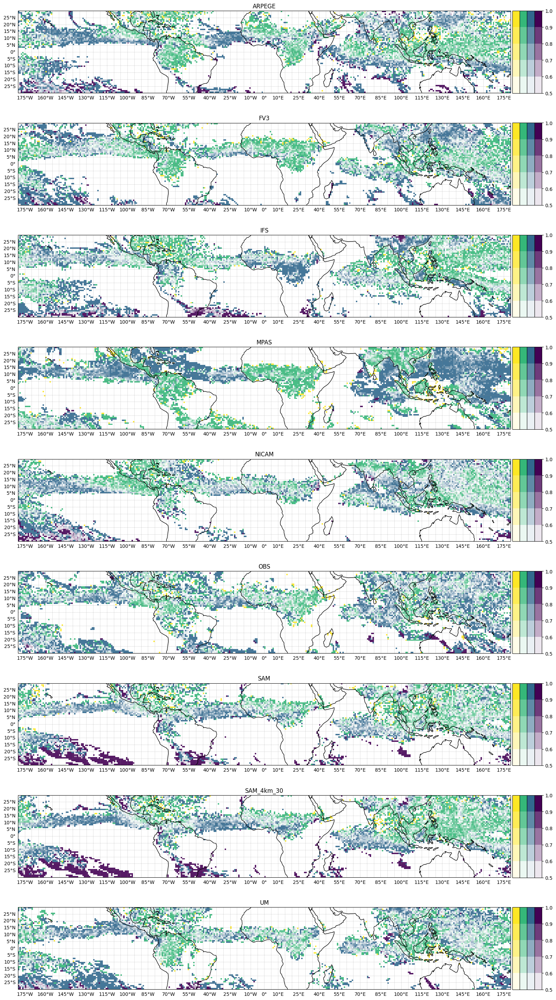

In [31]:
###
All maps here 
###


import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import warnings
import cartopy.crs as ccrs
import matplotlib.ticker as mticker

####################### This block defines the values and colormap #################################
values = np.array([1, 2, 3, 4])
cmap = mpl.cm.viridis
norm = mpl.colors.BoundaryNorm(np.arange(0.5, 5), cmap.N)

# Sample colors from the viridis colormap
colors = cmap(norm(values))

cmaps = []
# Function to create a unicolor colormap with white/blank first, base color, then dark
def create_unicolor_colormap(base_color):
    # Create colors that start from white, transition to the base color, then to dark
    start = np.array([1, 1, 1, 1])  # white color
    end = np.array(base_color) # base color
    light_color = start + (end - start) * 0.1
    new_colors = [light_color * (1 - i) + end * i for i in np.linspace(0, 1, 256)]
    return mpl.colors.LinearSegmentedColormap.from_list("unicolor", new_colors)

for i, color in enumerate(colors[::-1]):
    new_cmap = create_unicolor_colormap(color)
    cmaps.append(new_cmap)
#####################################################################################################

colormaps = cmaps

# Norms (assuming same boundaries for simplification)
norms = [mpl.colors.BoundaryNorm([0.5, 0.6, 0.7, 0.8, 0.9, 1], colormap.N) for colormap in colormaps]

#### This block makes mask_all 
rank_conv_min = 95
rank_acc_min = 95
mask_alls =[]

# Assume jds is already defined and filled with the necessary data
figdir = '/figures/'

for jd in jds: 
    jd.make_mask()
    mask_rank_conv = np.outer(jd.dist1.ranks >= 0, jd.dist2.ranks >= rank_conv_min)
    mask_rank_acc = np.outer(jd.dist1.ranks >= rank_acc_min , jd.dist2.ranks >= 0)
    mask_alls.append([
        np.logical_and(jd.mask_branch1_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_c_90, mask_rank_conv), 
        np.logical_and(jd.mask_coloc_ac_90, mask_rank_acc), 
        np.logical_and(jd.mask_branch2_90, mask_rank_acc)
    ])
####

# Calculate figure size based on jd grid
dlon = np.diff((jds[0].grid.casestudy.lon_slice.start, jds[0].grid.casestudy.lon_slice.stop))[0] % 360
if dlon == 0: dlon = 360
dlat = np.diff((jds[0].grid.casestudy.lat_slice.start, jds[0].grid.casestudy.lat_slice.stop))[0]
Lx_fig = 15
Lx_cbar = 1.5
Ly_title = 1
Ly_fig = (Lx_fig - Lx_cbar) / dlon * dlat + Ly_title
print('figure size =', Lx_fig, Ly_fig)

# Initialize figure with subplots
fig, axes = plt.subplots(len(jds), 1, figsize=(Lx_fig, Ly_fig * len(jds)), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=0)})

if len(jds) == 1:
    axes = [axes]

for jd, mask_all, ax in zip(jds, mask_alls, axes):
    list_mask_yxt = []
    for mask_ranked, cmap in zip(mask_all, cmaps):
        mask_yxt = jd.get_mask_yxt_from_mask_jdist(mask_ranked)
        list_mask_yxt.append(mask_yxt)
    mask_yxt_stacked = np.stack(list_mask_yxt)
    mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))
    data_layers = [data for data in mask_yxt_stacked]
    for data in data_layers:
        data[data < 0.5] = np.nan

    lat_1d = jd.get_coord_values('lat')
    lon_1d = jd.get_coord_values('lon')
    lon_meshgrid, lat_meshgrid = np.meshgrid(lon_1d, lat_1d)

    width = 0.1
    height = 1.118
    bottom = 0.1
    base_cax_positions = [[i-0.13, bottom, width, height] for i in [4, 4.1, 4.2, 4.3]]

    # Get the current axis position to adjust the cax positions accordingly
    pos = ax.get_position()
    # print(pos)
    cax_positions = []

    for base_pos in base_cax_positions:
        cax_positions.append([
            pos.x0 + base_pos[0] * pos.width,
            1.2685*(pos.y0-0.1) +0.0041, #+ base_pos[1]* pos.height,
            base_pos[2] * pos.width,
            base_pos[3] * pos.height
        ])

    for i, (data, colormap, norm) in enumerate(zip(data_layers, colormaps, norms)):
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            im = ax.pcolormesh(lon_meshgrid, lat_meshgrid, data, transform=ccrs.PlateCarree(), alpha=0.9, cmap=colormap, norm=norm)
        
        cax = fig.add_axes(cax_positions[i])
        cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=colormap), cax=cax, ticks=[0.5, 0.6, 0.7, 0.8, 0.9, 1], spacing='uniform')
        if i != 3: 
            cb.set_ticks([]) 

    ax.set_title(jd.name[:-15])
    ax.coastlines('110m')
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlocator = mticker.FixedLocator(range(-180, 181, 5))
    gl.ylocator = mticker.FixedLocator(range(-90, 91, 5))
    gl.top_labels = False  # Turn off labels on top x-axis
    gl.right_labels = False  # Turn off labels on right y-axis
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

plt.tight_layout()
# plt.show()
plt.savefig("figures/all_map_domain_chart.png", dpi=300)


figure size = 15 3.25


/scratchx/mcarenso/ipykernel_4132726/1276611743.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44058908045977013, y0=0.7472413793103448, x1=0.5844109195402298, y1=0.88)


/scratchx/mcarenso/ipykernel_4132726/1276611743.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44058908045977013, y0=0.5879310344827586, x1=0.5844109195402298, y1=0.7206896551724138)


/scratchx/mcarenso/ipykernel_4132726/1276611743.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44058908045977013, y0=0.4286206896551724, x1=0.5844109195402298, y1=0.5613793103448276)


/scratchx/mcarenso/ipykernel_4132726/1276611743.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))


Bbox(x0=0.44058908045977013, y0=0.2693103448275862, x1=0.5844109195402298, y1=0.40206896551724136)


/scratchx/mcarenso/ipykernel_4132726/1276611743.py:79: RuntimeWarning: invalid value encountered in divide
  mask_yxt_stacked = np.sum(mask_yxt_stacked, axis=-1) / np.sum(mask_yxt_stacked, axis=(0, -1))
/scratchx/mcarenso/ipykernel_4132726/1276611743.py:126: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Bbox(x0=0.44058908045977013, y0=0.10999999999999999, x1=0.5844109195402298, y1=0.24275862068965515)


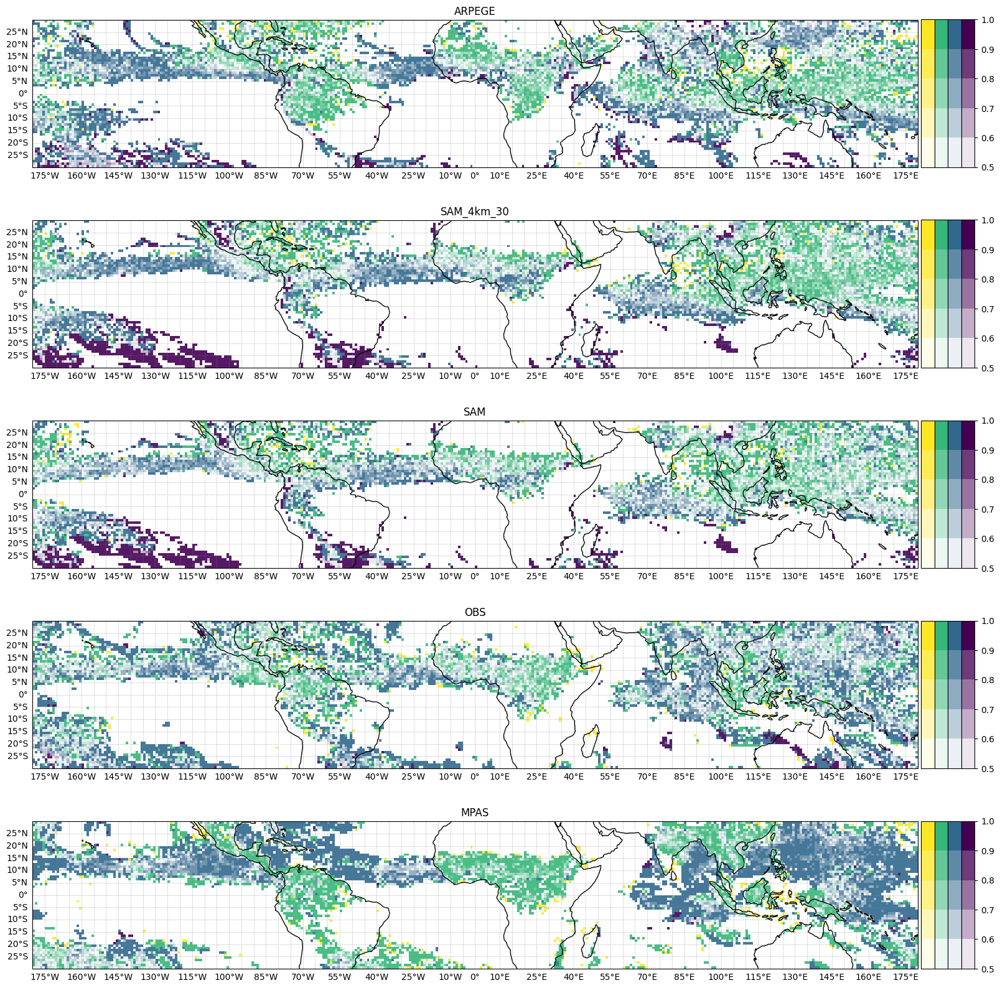